In [30]:
# Install plotting library 
# make sure virtualenv or conda env are active as kernel if you don't want to download on your User library
# see this if you don't know what I'm talking about: https://janakiev.com/blog/jupyter-virtual-envs/
!pip install plotly

     |████████████████████████████████| 23.9 MB 1.1 MB/s eta 0:00:01


In [1]:
import neurphys.read_pv as rpv
import neurphys.pacemaking as pace
import numpy as np
import pandas as pd
from glob import glob
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
file = '/Users/discovery/Desktop/Neuron/enrico/python_scripts_and_experiments/3_19_18_s1c3/VoltageRecording-03192018-1358_percevalhr_s1c3-010'

In [19]:
# file = '/Users/discovery/Desktop/Neuron/enrico/python_scripts_and_experiments/2_21_18_s1c1/VoltageRecording-02212018-1411_S1C1-009'

In [20]:
# file = '/Users/discovery/Desktop/Neuron/enrico/python_scripts_and_experiments/3_20_18_s2c1/VoltageRecording-03202018-1404_percevalhr_s2c1-008'

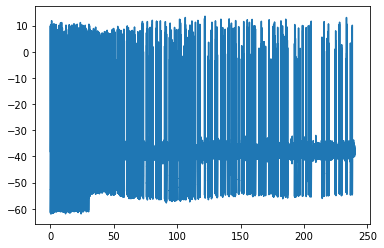

In [3]:
# Load and check recording
df = rpv.import_folder(file)['voltage recording']
plt.plot(df.time, df.primary)

In [7]:
cv = lambda x: np.std(x, ddof=1) / np.mean(x) * 100


def plot_cv(subset, indices, xs, cvs, avg_spike_rate, means, variances, file):
    
    # Plot voltage trace and CV etc on one plot 
    
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(x=subset.time, y=subset.primary, name='Voltage Trace'))
    fig.add_trace(go.Scatter(x=subset.time.iloc[indices], y=subset.primary.iloc[indices],
                        mode='markers',
                        name='Peaks'))
    fig.add_trace(go.Scatter(x=xs, y=avg_spike_rate, name='Spike Rate'))
    fig.add_trace(go.Scatter(x=xs, y=cvs, name='Coefficient of Variation'))
    fig.add_trace(go.Scatter(x=xs, y=means, name='Mean'))
    fig.add_trace(go.Scatter(x=xs, y=variances, name='Variance'))
    
    
    fig.update_layout(
        title="{}".format(file.split('/')[-1]),
        xaxis_title="Time (S)",
        yaxis_title="V (mV)")
    fig.show()  

    # To plot seperate figure for CV, mean, variance
    
#     fig_cv = go.Figure()
#     fig_cv.add_trace(go.Scatter(x=xs, y=cvs, name='Coefficient of Variation'))
#     fig_cv.add_trace(go.Scatter(x=xs, y=means, name='Mean'))
#     fig_cv.add_trace(go.Scatter(x=xs, y=variances, name='Variance'))
    
#     fig_cv.update_layout(
#         title="{} CV".format(file.split('/')[-1]),
#         xaxis_title="Time (S)",
#         yaxis_title="CV")
#     fig_cv.show()  


def calculate_cv(df, window, stride, start, stop, file):

    
    no_isi = 0 
    
    window_end = window

    mask = (df.time >= start) & (df.time <= stop)
    subset = df[mask]
    
    window_mask = [0] * subset.count().time
    num_windows = 1

    avg_spike_rate = []
    cvs = [] 
    means = []
    variances = []

    indices = pace.detect_peaks(subset.primary, mph=-20, mpd=20)
#     print("Indices:{}".format(indices))
    spike_times = subset.iloc[indices].time.values
#     print("Times:{}".format(times))
    isi = spike_times[1:] - spike_times[:-1]
#     print("ISI:{}".format(isi))

    while window_end < subset.count().time:

        window_isi = []

        window_times = subset.iloc[window_end - window:window_end].time.to_numpy()

        # Check if spike in window
        if np.any(np.in1d(spike_times, window_times)):
            for time in window_times:
                if np.isin(time, spike_times):
                    window_isi.append(isi[np.where(spike_times == time)[0]-1][0])


        if len(window_isi) > 1:
            avg_spike_rate.append(len(window_isi)/np.sum(window_isi))
            std = np.std(window_isi, ddof=1) 
            variances.append(std**2)
            mean = np.mean(window_isi) * 100
            means.append(mean)
            window_cv = cv(window_isi) 
            cvs.append(window_cv) 
            window_mask[num_windows] = 1
        else:
            no_isi += 1
            window_mask[num_windows] = 0

        window_end += stride 
        num_windows += 1

    xs = subset.time.to_numpy() * window_mask
    xs = xs[xs != 0] * 1000
        
    plot_cv(subset, indices, xs, cvs, avg_spike_rate, means, variances, file)
    
    return subset, spike_times, isi, indices, xs, cvs, avg_spike_rate, means, variances, num_windows, no_isi, window_mask

In [8]:
window = 5000
stride = 1000
start = df.time[0]
stop = df.time[-1]

subset, spike_times, isi, indices, xs, cvs, avg_spike_rate, means, variances, num_windows, no_isi, window_mask = calculate_cv(df, window, stride, start, stop, file)

In [34]:
# Save data to csv
d = {'Time (ms)': xs, 'CV': cvs, 'Avg Spike Rate (mHz)': avg_spike_rate}
df_csv = pd.DataFrame(data=d)
print(df_csv)
df_csv.to_csv("./test.csv")

     Time (ms)         CV  Avg Spike Rate (mHz)
0          1.0   5.696072              4.685272
1          2.0   4.832722              4.646465
2          3.0   6.462240              4.673807
3          4.0   6.637991              4.759072
4          5.0   7.520746              4.904846
..         ...        ...                   ...
195      196.0  22.617401              9.875050
196      197.0  20.779945              9.392486
197      198.0  21.912347              9.262909
198      199.0  24.257214              8.830455
199      200.0  22.959218              8.625878

[200 rows x 3 columns]


In [48]:
# Sidenote: the # of windows should equal the # of CV calculations + windows without # of spikes for calculation = # nonzero entries in window_mask
# len(cvs) + no_isi = num_windows -1 = window_mask > 0

418

In [33]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=spike_times, y=1/isi, name='Spike Rate'))
fig.add_trace(go.Scatter(x=xs, y=avg_spike_rate, name='Avg Spike Rate'))


fig.update_layout(
    title="{}".format(file.split('/')[-1]),
    xaxis_title="Time (S)",
    yaxis_title="Spike Rate (mHz)")
fig.show() 